# Import Dependencies & Data

In [ ]:
import tensorflow as tf
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras import layers, models
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
from sklearn.model_selection import train_test_split
from PIL import Image
import random
import glob
import cv2


In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All"
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/traffic-density-singapore/Final Dataset/validation/Empty/5dba4cf2-47f3-4578-9598-338682ac272b.jpg
/kaggle/input/traffic-density-singapore/Final Dataset/validation/Empty/6e874b75-21f4-4809-84e8-9bd0be74d32d.jpg
/kaggle/input/traffic-density-singapore/Final Dataset/validation/Empty/3afb983d-a3dd-49d8-8465-de08c5b101b7.jpg
/kaggle/input/traffic-density-singapore/Final Dataset/validation/Empty/3b3c7b48-feec-4cf4-a51b-5300bed54fbb.jpg
/kaggle/input/traffic-density-singapore/Final Dataset/validation/Empty/1d88705e-03bc-4b1e-8b9b-c2930f28debd.jpg
/kaggle/input/traffic-density-singapore/Final Dataset/validation/Empty/0cdd34a7-d5fe-4975-92c4-3deb8ca7da04.jpg
/kaggle/input/traffic-density-singapore/Final Dataset/validation/Empty/1b68e03c-f8bc-4177-b185-fa7666b22490.jpg
/kaggle/input/traffic-density-singapore/Final Dataset/validation/Empty/0a7b874b-20dd-4ab2-b2ed-89645e4c20bc.jpg
/kaggle/input/traffic-density-singapore/Final Dataset/validation/Empty/2eb9ab04-7772-4cde-aec1-11c62a8d7

# Checking The Data

            Empty  Traffic Jam  Low  High  Medium
training     1186          190  936   378     688
validation    120           18   94    38      70
testing        64           64   64    64      64


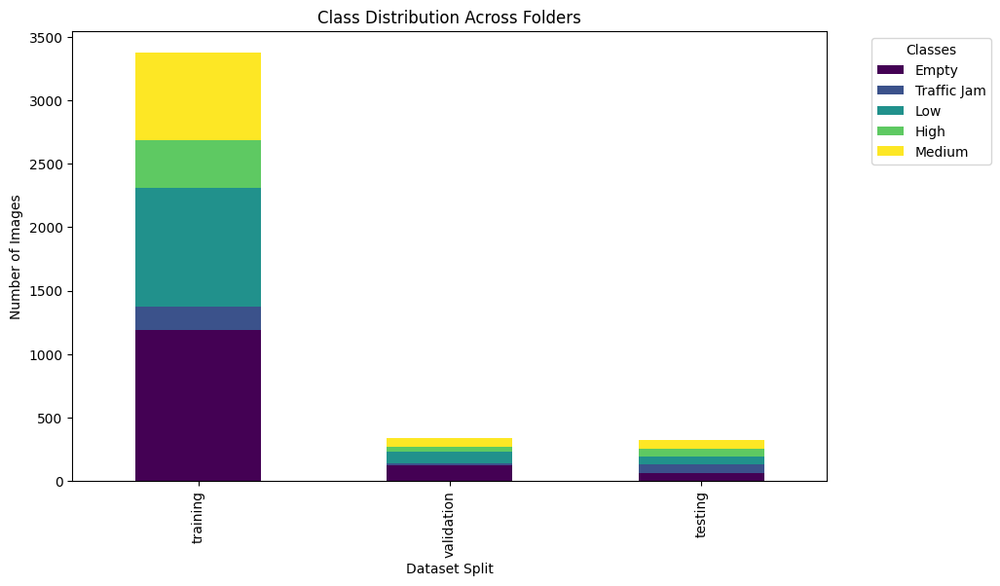

In [ ]:
# Define directories
base_dir = "/kaggle/input/traffic-density-singapore/Final Dataset"
folders = ['training', 'validation', 'testing']

# Visualize distribution
class_counts = {}
for folder in folders:
    folder_path = os.path.join(base_dir, folder)
    class_counts[folder] = {}
    for class_name in os.listdir(folder_path):
        class_path = os.path.join(folder_path, class_name)
        if os.path.isdir(class_path):
            class_counts[folder][class_name] = len(os.listdir(class_path))

# Create a DataFrame for visualization
distribution_df = pd.DataFrame(class_counts).T
print(distribution_df)

# Plot the distribution
distribution_df.plot(kind='bar', stacked=True, figsize=(10, 6), colormap='viridis')
plt.title('Class Distribution Across Folders')
plt.xlabel('Dataset Split')
plt.ylabel('Number of Images')
plt.legend(title='Classes', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()


In [ ]:
print(distribution_df)

            Empty  Traffic Jam  Low  High  Medium
training     1186          190  936   378     688
validation    120           18   94    38      70
testing        64           64   64    64      64


> There's imbalanced among the classes

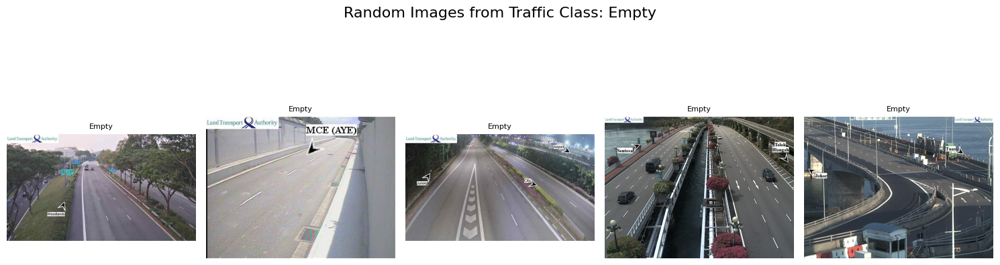

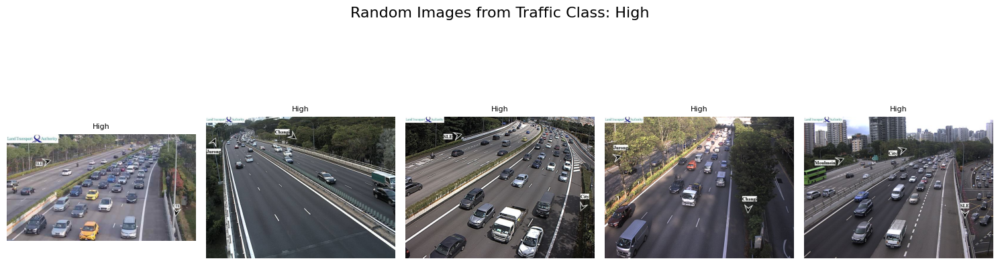

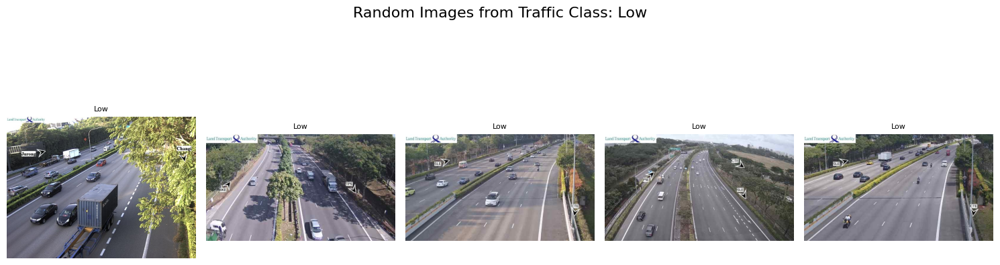

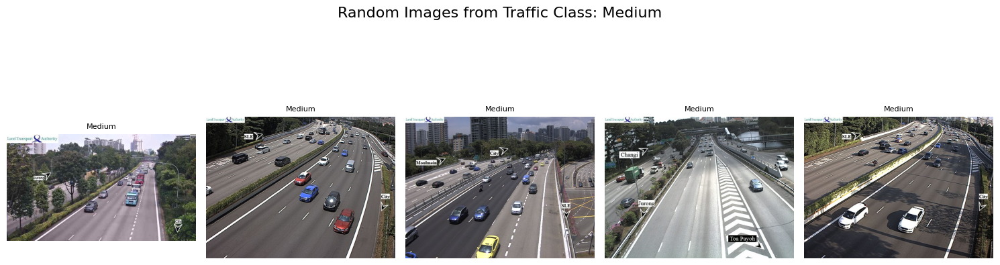

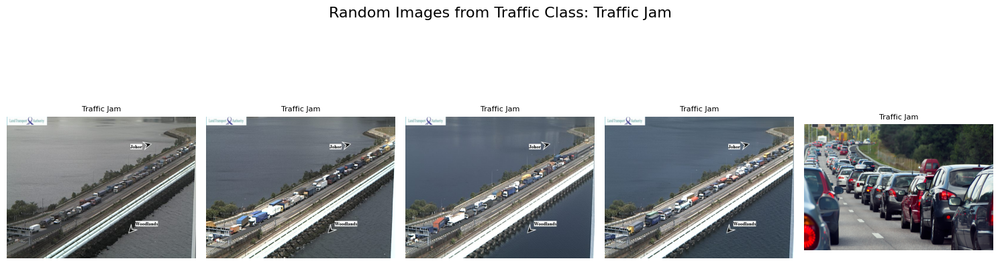

In [ ]:
import os
import glob
import random
import matplotlib.pyplot as plt
from PIL import Image

def plot_images_for_traffic(traffic_condition, filtered_dataset_path, grid_shape=(1, 5)):
    """
    Plot 5 random images for a specific traffic condition.

    :param traffic_condition: The name of the traffic condition (e.g., 'High').
    :param filtered_dataset_path: Path to the filtered dataset.
    :param grid_shape: Tuple for grid layout (rows, columns).
    """
    # Construct the path for the specific traffic condition
    class_path = os.path.join(filtered_dataset_path, traffic_condition)

    if not os.path.exists(class_path):
        print(f"Class '{traffic_condition}' does not exist in the dataset.")
        return

    # Get all image paths in the class folder
    image_files = glob.glob(os.path.join(class_path, "*.jpg"))
    if len(image_files) < 5:
        print(f"Class '{traffic_condition}' has less than 5 images.")
        return

    # Randomly select 5 images
    random_images = random.sample(image_files, 5)

    # Plotting the images
    plt.figure(figsize=(15, 5))  # Adjust the size to match the grid
    plt.suptitle(f"Random Images from Traffic Class: {traffic_condition}", fontsize=16)

    for idx, img_path in enumerate(random_images):
        img = Image.open(img_path)
        plt.subplot(grid_shape[0], grid_shape[1], idx + 1)
        plt.imshow(img)
        plt.axis('off')
        plt.title(traffic_condition.replace("_", " "), fontsize=8)

    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

# To visualize for all traffic conditions:
traffic_conditions = ["Empty", "High", "Low", "Medium", "Traffic Jam"]
filtered_dataset_path = "/kaggle/input/traffic-density-singapore/Final Dataset/training"  # Replace with your dataset path

for traffic_condition in traffic_conditions:
    plot_images_for_traffic(traffic_condition, filtered_dataset_path)

# Preprocessing Data (Handle the Imbalanced Data)

### Handle the imbalance data

In [ ]:
import os
import tensorflow as tf
from sklearn.utils.class_weight import compute_class_weight
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Define the class distribution for training data
class_counts = {
    "Empty": 1186,
    "Traffic Jam": 190,
    "Low": 936,
    "High": 378,
    "Medium": 688
}

# Extract class names and their respective counts
class_names = list(class_counts.keys())
class_values = list(class_counts.values())

# Calculate class weights
total_samples = sum(class_values)
class_weights = {
    i: total_samples / (len(class_counts) * count)
    for i, count in enumerate(class_values)
}
print("Class Weights:", class_weights)

Class Weights: {0: 0.56964586846543, 1: 3.5557894736842104, 2: 0.7217948717948718, 3: 1.7873015873015874, 4: 0.9819767441860465}


### Augment the Images

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import os

# Data augmentation for the training set
train_datagen = ImageDataGenerator(
    rescale=1.0/255,  # Rescale images to [0, 1]
    rotation_range=15,  # Rotate slightly (traffic images are mostly stationary)
    width_shift_range=0.1,  # Small horizontal shifts (traffic images may be slightly off-center)
    height_shift_range=0.1,  # Small vertical shifts (traffic images can be taken from varying angles)
    shear_range=0.1,  # Slight shearing (to simulate camera tilt)
    zoom_range=0.1,  # Slight zooms (to simulate distance changes)
    horizontal_flip=True,  # Horizontal flips (can simulate reversing lanes or moving cars)
    fill_mode='nearest'  # Fill pixels after transformation with the nearest value
)

# No augmentation for validation and testing sets, only rescaling
val_test_datagen = ImageDataGenerator(rescale=1.0/255)

# Define dataset directories
base_dir = "/kaggle/input/traffic-density-singapore/Final Dataset"  # Replace with the actual base directory
train_dir = os.path.join(base_dir, 'training')
validation_dir = os.path.join(base_dir, 'validation')
test_dir = os.path.join(base_dir, 'testing')

# Data generators for the training, validation, and testing sets
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(224, 224),  # Resize to (224, 224) for model compatibility
    batch_size=32,
    class_mode='categorical'  # Multi-class classification
)

validation_generator = val_test_datagen.flow_from_directory(
    validation_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical'
)

test_generator = val_test_datagen.flow_from_directory(
    test_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    shuffle=False  # No shuffling for evaluation to keep results consistent
)


Found 3378 images belonging to 5 classes.
Found 340 images belonging to 5 classes.
Found 320 images belonging to 5 classes.


#### Visualize The Augmented Images

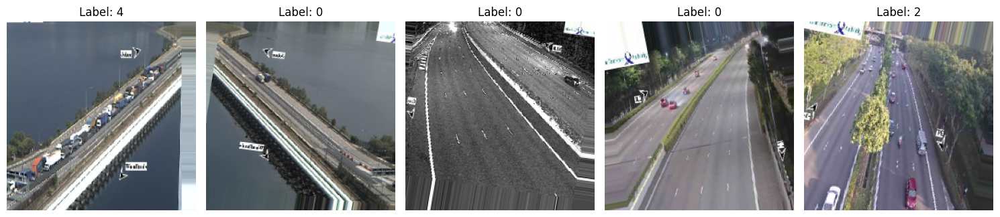

In [ ]:
import matplotlib.pyplot as plt

def visualize_augmented_data(generator, num_images=5):
    # Create a figure with subplots
    plt.figure(figsize=(15, 5))

    # Generate and display augmented images
    for i in range(num_images):
        # Get a batch of images and labels
        x, y = next(generator)

        # Display the first image in the batch
        plt.subplot(1, num_images, i + 1)
        plt.imshow(x[0])  # Show the first image from the batch
        plt.title(f"Label: {np.argmax(y[0])}")  # Show the label (class index)
        plt.axis('off')

    plt.tight_layout()
    plt.show()

# Visualize augmented images from the training generator
visualize_augmented_data(train_generator)

# Model Training

## Model using VGG16

In [ ]:
import numpy as np
from tensorflow.keras import layers, models
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import tensorflow as tf
from sklearn.utils.class_weight import compute_class_weight

# Compute class weights based on imbalanced data
train_labels = train_generator.classes
class_weights = compute_class_weight('balanced', classes=np.unique(train_labels), y=train_labels)
class_weight_dict = dict(zip(np.unique(train_labels), class_weights))

# Load the VGG16 model with pre-trained weights, excluding the top fully connected layers
vgg16_base_model = tf.keras.applications.VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze base model layers
vgg16_base_model.trainable = False

# Build the model
vgg16_model = models.Sequential([
    vgg16_base_model,
    layers.Flatten(),
    layers.Dense(256, activation='relu'),
    layers.Dropout(0.5),
    layers.Dense(5, activation='softmax')  # 5 classes
])

# Compile the model
vgg16_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Train the model with class weights
vgg16_history = vgg16_model.fit(
    train_generator,
    validation_data=validation_generator,
    epochs=10,  # Adjust based on performance
    class_weight=class_weight_dict,  # Using class weights to handle class imbalance
    verbose=1
)


58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Epoch 1/10


/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()
I0000 00:00:1733821739.945105     114 service.cc:145] XLA service 0x7a186000f430 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1733821739.945170     114 service.cc:153]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0


  2/106 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.1562 - loss: 4.5384  

I0000 00:00:1733821750.875489     114 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


106/106 ━━━━━━━━━━━━━━━━━━━━ 83s 632ms/step - accuracy: 0.3452 - loss: 3.0420 - val_accuracy: 0.6235 - val_loss: 0.9363
Epoch 2/10
106/106 ━━━━━━━━━━━━━━━━━━━━ 49s 434ms/step - accuracy: 0.5337 - loss: 0.9965 - val_accuracy: 0.6353 - val_loss: 0.8194
Epoch 3/10
106/106 ━━━━━━━━━━━━━━━━━━━━ 49s 436ms/step - accuracy: 0.5700 - loss: 0.9229 - val_accuracy: 0.7647 - val_loss: 0.6380
Epoch 4/10
106/106 ━━━━━━━━━━━━━━━━━━━━ 49s 435ms/step - accuracy: 0.6081 - loss: 0.8759 - val_accuracy: 0.6647 - val_loss: 0.7647
Epoch 5/10
106/106 ━━━━━━━━━━━━━━━━━━━━ 49s 435ms/step - accuracy: 0.6179 - loss: 0.8294 - val_accuracy: 0.7324 - val_loss: 0.6246
Epoch 6/10
106/106 ━━━━━━━━━━━━━━━━━━━━ 50s 440ms/step - accuracy: 0.6235 - loss: 0.7975 - val_accuracy: 0.7765 - val_loss: 0.5733
Epoch 7/10
106/106 ━━━━━━━━━━━━━━━━━━━━ 49s 433ms/step - accuracy: 0.5990 - loss: 0.8429 - val_accuracy: 0.7882 - val_loss: 0.6026
Epoch 8/10
106/106 ━━━━━━━━━━━━━━━━━━━━ 49s 429ms/step - accuracy: 0.6434 - loss: 0.7825 - val

## Export The Model (VGG16)

In [ ]:
# Save VGG16 model
vgg16_model.save('vgg16_model.h5')
print("VGG16 model saved as 'vgg16_model.h5'")

## Model using MobileNetV2

In [ ]:
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import layers, models
import tensorflow as tf

# Load the MobileNetV2 model with pre-trained weights, excluding the top layers
mobilenetv2_base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze base model layers
mobilenetv2_base_model.trainable = False

# Build the model
mobilenetv2_model = models.Sequential([
    mobilenetv2_base_model,
    layers.GlobalAveragePooling2D(),  # Replace Flatten with GAP for better efficiency
    layers.Dense(256, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.01)),
    layers.Dropout(0.5),
    layers.Dense(5, activation='softmax')  # 5 classes
])

# Compile with Adam optimizer
mobilenetv2_optimizer = Adam(learning_rate=0.001)  # Adjust learning rate
mobilenetv2_model.compile(optimizer=mobilenetv2_optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

# Learning rate scheduler and early stopping
mobilenetv2_lr_scheduler = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-6, verbose=1)
mobilenetv2_early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True, verbose=1)

# Train the model
mobilenetv2_history = mobilenetv2_model.fit(
    train_generator,
    validation_data=validation_generator,
    epochs=20,  # Increase epochs for tuning
    callbacks=[mobilenetv2_lr_scheduler, mobilenetv2_early_stopping],
    verbose=1
)

# Unfreeze some base model layers for fine-tuning
mobilenetv2_base_model.trainable = True
for layer in mobilenetv2_base_model.layers[:100]:  # Freeze first 100 layers
    layer.trainable = False

# Re-compile for fine-tuning
mobilenetv2_model.compile(optimizer=Adam(learning_rate=1e-4), loss='categorical_crossentropy', metrics=['accuracy'])

# Fine-tune the model
mobilenetv2_fine_tune_history = mobilenetv2_model.fit(
    train_generator,
    validation_data=validation_generator,
    epochs=20,
    callbacks=[mobilenetv2_lr_scheduler, mobilenetv2_early_stopping],
    verbose=1
)


9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Epoch 1/20
106/106 ━━━━━━━━━━━━━━━━━━━━ 71s 537ms/step - accuracy: 0.5274 - loss: 4.3191 - val_accuracy: 0.7176 - val_loss: 1.9670 - learning_rate: 0.0010
Epoch 2/20
106/106 ━━━━━━━━━━━━━━━━━━━━ 49s 434ms/step - accuracy: 0.6934 - loss: 1.8494 - val_accuracy: 0.7824 - val_loss: 1.2704 - learning_rate: 0.0010
Epoch 3/20
106/106 ━━━━━━━━━━━━━━━━━━━━ 50s 437ms/step - accuracy: 0.7059 - loss: 1.2898 - val_accuracy: 0.7265 - val_loss: 1.0365 - learning_rate: 0.0010
Epoch 4/20
106/106 ━━━━━━━━━━━━━━━━━━━━ 49s 429ms/step - accuracy: 0.7209 - loss: 1.0592 - val_accuracy: 0.7588 - val_loss: 0.8556 - learning_rate: 0.0010
Epoch 5/20
106/106 ━━━━━━━━━━━━━━━━━━━━ 49s 436ms/step - accuracy: 0.7095 - loss: 0.9927 - val_accuracy: 0.7735 - val_loss: 0.8032 - learning_rate: 0.0010
Epoch 6/20
106/106 ━━━━━━━━━━━━━━━━━━━━ 49s 434ms/step - accuracy: 0.7270 - loss: 0.8734 - val_accuracy: 0.7471 - val_loss: 0.8051 - learning_rate: 0.0010
Epoch 7/20
106/106 ━━

## Export The Model (MobileNetV2)


In [ ]:
# Save MobileNetV2 model
mobilenetv2_model.save('mobilenetv2_model.h5')
print("MobileNetV2 model saved as 'mobilenetv2_model.h5'")

MobileNetV2 model saved as 'mobilenetv2_model.h5'


# Model Evaluation

## Model VGG16

### Accuracy & Loss Train & Val Split (VGG16)

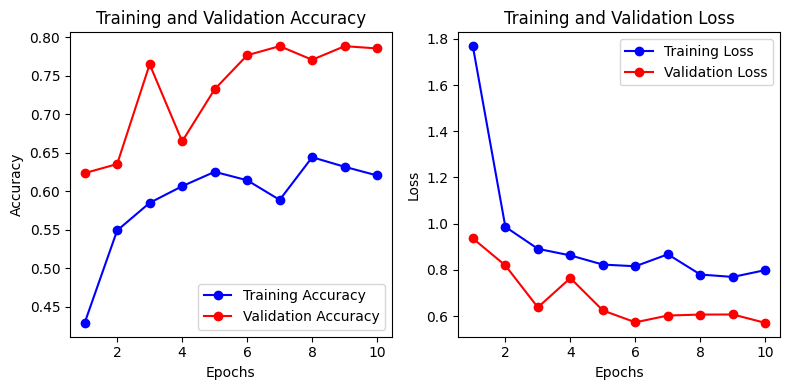

In [ ]:
# Plot training/validation accuracy and loss
def plot_training_history(history):
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    loss = history.history['loss']
    val_loss = history.history['val_loss']
    epochs = range(1, len(acc) + 1)

    plt.figure(figsize=(8, 4)) # Adjust figure size for two separate plots
    plt.subplot(1, 2, 1) # Create subplot for accuracy
    plt.plot(epochs, acc, 'bo-', label='Training Accuracy')
    plt.plot(epochs, val_acc, 'ro-', label='Validation Accuracy')
    plt.title('Training and Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    plt.subplot(1, 2, 2) # Create subplot for loss
    plt.plot(epochs, loss, 'bo-', label='Training Loss')
    plt.plot(epochs, val_loss, 'ro-', label='Validation Loss')
    plt.title('Training and Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.tight_layout() # Adjust layout to prevent overlapping
    plt.show()

plot_training_history(vgg16_history)

### Analyze Misclassications (VGG16)

10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step
Misclassification Summary:
True Class
Empty           3
High            3
Low            20
Medium         22
Traffic Jam     3
dtype: int64


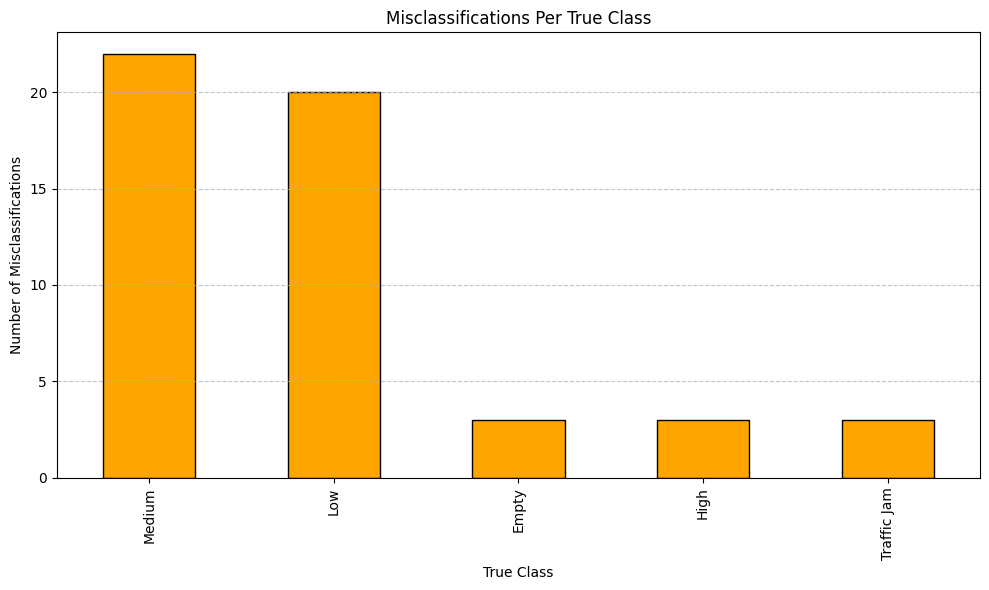

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

def analyze_misclassifications(model, val_gen):
    # Get all images and labels from the validation generator
    all_images, all_labels = [], []
    for images, labels in val_gen:
        all_images.append(images)
        all_labels.append(labels)
        if len(all_images) * val_gen.batch_size >= val_gen.samples:
            break

    # Stack all batches into one array
    all_images = np.vstack(all_images)
    all_labels = np.vstack(all_labels)

    # Make predictions
    predictions = model.predict(all_images)

    # Convert labels and predictions to class indices
    true_labels = np.argmax(all_labels, axis=1)
    pred_labels = np.argmax(predictions, axis=1)

    # Map indices to class names
    class_names = {v: k for k, v in val_gen.class_indices.items()}

    # Find misclassified indices
    misclassified_indices = np.where(true_labels != pred_labels)[0]

    # Create a DataFrame to analyze misclassifications
    misclassified_data = pd.DataFrame({
        'True Class': [class_names[idx] for idx in true_labels[misclassified_indices]],
        'Predicted Class': [class_names[idx] for idx in pred_labels[misclassified_indices]]
    })

    # Count misclassifications per true class
    misclassified_summary = misclassified_data.groupby('True Class').size()

    # Print summary
    print("Misclassification Summary:")
    print(misclassified_summary)

    # Plot misclassification counts for each true class
    misclassified_summary.sort_values(ascending=False).plot(
        kind='bar', figsize=(10, 6), color='orange', edgecolor='black'
    )
    plt.title("Misclassifications Per True Class")
    plt.xlabel("True Class")
    plt.ylabel("Number of Misclassifications")
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

    return misclassified_data, misclassified_summary

# Analyze misclassifications
misclassified_data, misclassified_summary = analyze_misclassifications(vgg16_model, test_generator)


/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 103ms/step


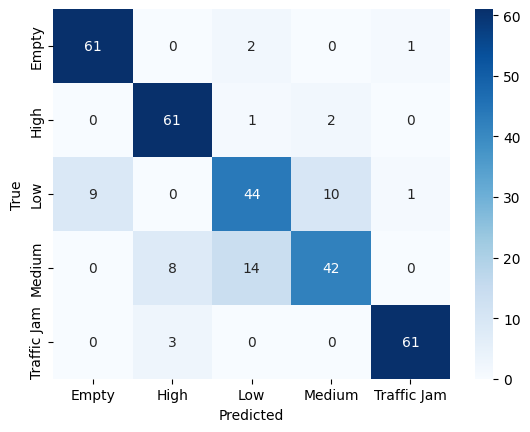

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

y_pred = vgg16_model.predict(test_generator)
y_pred_classes = np.argmax(y_pred, axis=1)
y_true = test_generator.classes
cm = confusion_matrix(y_true, y_pred_classes)

sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=test_generator.class_indices.keys(), yticklabels=test_generator.class_indices.keys())
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()


In [ ]:
from sklearn.metrics import classification_report

print(classification_report(y_true, y_pred_classes, target_names=validation_generator.class_indices.keys()))


              precision    recall  f1-score   support

       Empty       0.87      0.95      0.91        64
        High       0.85      0.95      0.90        64
         Low       0.72      0.69      0.70        64
      Medium       0.78      0.66      0.71        64
 Traffic Jam       0.97      0.95      0.96        64

    accuracy                           0.84       320
   macro avg       0.84      0.84      0.84       320
weighted avg       0.84      0.84      0.84       320



#### Predicting using the model

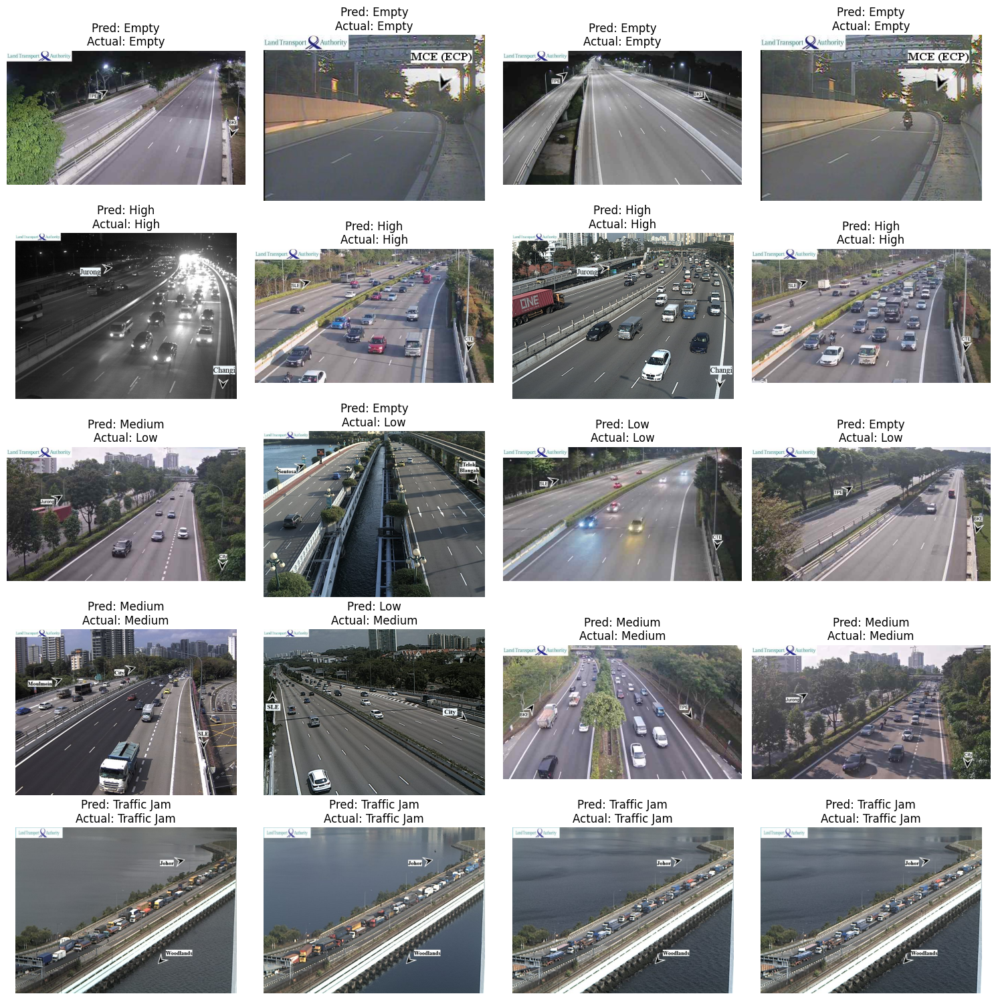

In [ ]:
import matplotlib.pyplot as plt
import os

# Collect 4 images per class
images_per_class = 4
class_samples = {class_name: [] for class_name in test_generator.class_indices.keys()}
for filepath, predicted_label in zip(test_generator.filenames, vgg16_predicted_classes):
    actual_class = filepath.split('/')[0]  # Extract actual class from the directory structure
    if len(class_samples[actual_class]) < images_per_class:
        class_samples[actual_class].append((filepath, predicted_label))

# Plot 4 images per class
num_classes = len(class_samples)
fig, axes = plt.subplots(num_classes, images_per_class, figsize=(15, num_classes * 3))
axes = axes if num_classes > 1 else [axes]  # Handle case with only one class

class_labels_inv = {v: k for k, v in test_generator.class_indices.items()}  # Reverse class mapping

for row_idx, (actual_class, samples) in enumerate(class_samples.items()):
    for col_idx in range(images_per_class):
        ax = axes[row_idx][col_idx] if num_classes > 1 else axes[col_idx]
        if col_idx < len(samples):
            filepath, predicted_label = samples[col_idx]
            img_path = os.path.join('/kaggle/input/traffic-density-singapore/Final Dataset/testing', filepath)
            img = plt.imread(img_path)
            ax.imshow(img)
            ax.axis('off')
            predicted_class = class_labels_inv[predicted_label]
            ax.set_title(f"Pred: {predicted_class}\nActual: {actual_class}")
        else:
            ax.axis('off')  # Hide unused subplots

plt.tight_layout()
plt.show()


In [ ]:
 # Predict using VGG16
vgg16_colab_predictions = vgg16_model.predict(images)
vgg16_colab_classes = np.argmax(vgg16_colab_predictions, axis=1)
vgg16_colab_labels = [class_labels[idx] for idx in vgg16_colab_classes]

# Predict using MobileNetV2
mobilenetv2_colab_predictions = mobilenetv2_model.predict(images)
mobilenetv2_colab_classes = np.argmax(mobilenetv2_colab_predictions, axis=1)
mobilenetv2_colab_labels = [class_labels[idx] for idx in mobilenetv2_colab_classes]

# Display results
for filename, vgg16_label, mobilenetv2_label in zip(uploaded.keys(), vgg16_colab_labels, mobilenetv2_colab_labels):
    print(f"File: {filename}")
    print(f"  VGG16 Prediction: {vgg16_label}")
    print(f"  MobileNetV2 Prediction: {mobilenetv2_label}")


## Model MobileNet V2

### Accuracy & Loss Train & Val Split (MobileNetV2)

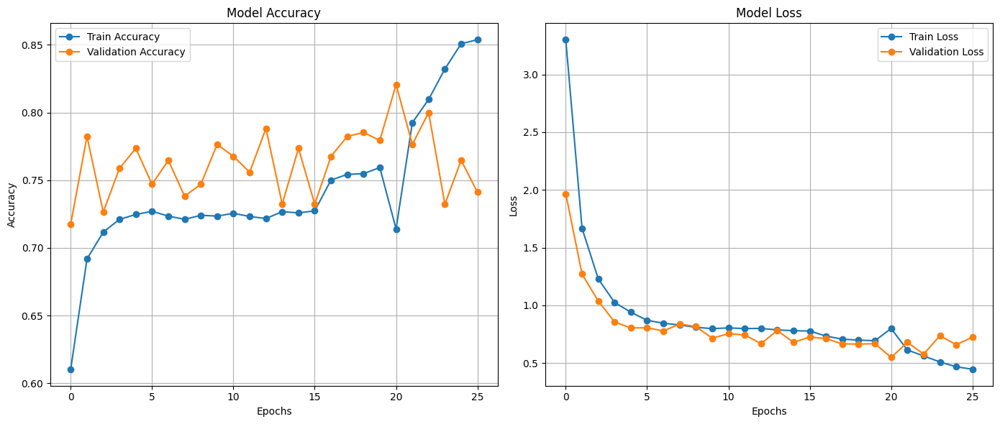

In [ ]:
# Extract accuracy and loss data from the history object
train_accuracy = mobilenetv2_history.history['accuracy']
val_accuracy = mobilenetv2_history.history['val_accuracy']
train_loss = mobilenetv2_history.history['loss']
val_loss = mobilenetv2_history.history['val_loss']

# Fine-tuning phase
train_accuracy_fine = mobilenetv2_fine_tune_history.history['accuracy']
val_accuracy_fine = mobilenetv2_fine_tune_history.history['val_accuracy']
train_loss_fine = mobilenetv2_fine_tune_history.history['loss']
val_loss_fine = mobilenetv2_fine_tune_history.history['val_loss']

# Combine initial training and fine-tuning results
total_train_accuracy = train_accuracy + train_accuracy_fine
total_val_accuracy = val_accuracy + val_accuracy_fine
total_train_loss = train_loss + train_loss_fine
total_val_loss = val_loss + val_loss_fine

# Plot accuracy
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
plt.plot(total_train_accuracy, label='Train Accuracy', marker='o')
plt.plot(total_val_accuracy, label='Validation Accuracy', marker='o')
plt.title('Model Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.grid()

# Plot loss
plt.subplot(1, 2, 2)
plt.plot(total_train_loss, label='Train Loss', marker='o')
plt.plot(total_val_loss, label='Validation Loss', marker='o')
plt.title('Model Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid()

plt.tight_layout()
plt.show()


### Analyze Misclassications (MobileNetV2)

10/10 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step
Misclassification Summary:
True Class
Empty           9
High            8
Low            22
Medium         17
Traffic Jam     4
dtype: int64


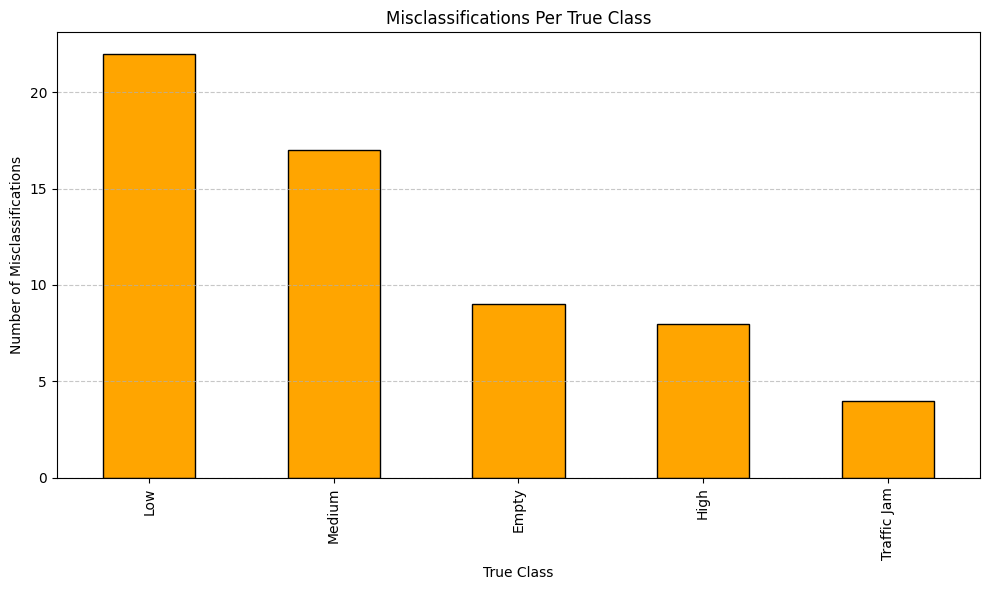

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

def analyze_misclassifications(model, val_gen):
    # Get all images and labels from the validation generator
    all_images, all_labels = [], []
    for images, labels in val_gen:
        all_images.append(images)
        all_labels.append(labels)
        if len(all_images) * val_gen.batch_size >= val_gen.samples:
            break

    # Stack all batches into one array
    all_images = np.vstack(all_images)
    all_labels = np.vstack(all_labels)

    # Make predictions
    predictions = model.predict(all_images)

    # Convert labels and predictions to class indices
    true_labels = np.argmax(all_labels, axis=1)
    pred_labels = np.argmax(predictions, axis=1)

    # Map indices to class names
    class_names = {v: k for k, v in val_gen.class_indices.items()}

    # Find misclassified indices
    misclassified_indices = np.where(true_labels != pred_labels)[0]

    # Create a DataFrame to analyze misclassifications
    misclassified_data = pd.DataFrame({
        'True Class': [class_names[idx] for idx in true_labels[misclassified_indices]],
        'Predicted Class': [class_names[idx] for idx in pred_labels[misclassified_indices]]
    })

    # Count misclassifications per true class
    misclassified_summary = misclassified_data.groupby('True Class').size()

    # Print summary
    print("Misclassification Summary:")
    print(misclassified_summary)

    # Plot misclassification counts for each true class
    misclassified_summary.sort_values(ascending=False).plot(
        kind='bar', figsize=(10, 6), color='orange', edgecolor='black'
    )
    plt.title("Misclassifications Per True Class")
    plt.xlabel("True Class")
    plt.ylabel("Number of Misclassifications")
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

    return misclassified_data, misclassified_summary

# Analyze misclassifications
misclassified_data, misclassified_summary = analyze_misclassifications(mobilenetv2_model, test_generator)


### Correlation Matrix (MobileNetV2)

10/10 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step


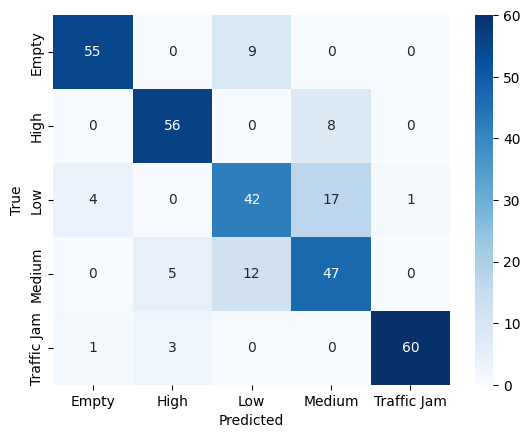

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

y_pred = mobilenetv2_model.predict(test_generator)
y_pred_classes = np.argmax(y_pred, axis=1)
y_true = test_generator.classes
cm = confusion_matrix(y_true, y_pred_classes)

sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=test_generator.class_indices.keys(), yticklabels=test_generator.class_indices.keys())
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()


In [ ]:
from sklearn.metrics import classification_report

print(classification_report(y_true, y_pred_classes, target_names=validation_generator.class_indices.keys()))


              precision    recall  f1-score   support

       Empty       0.92      0.86      0.89        64
        High       0.88      0.88      0.88        64
         Low       0.67      0.66      0.66        64
      Medium       0.65      0.73      0.69        64
 Traffic Jam       0.98      0.94      0.96        64

    accuracy                           0.81       320
   macro avg       0.82      0.81      0.81       320
weighted avg       0.82      0.81      0.81       320



10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 126ms/step


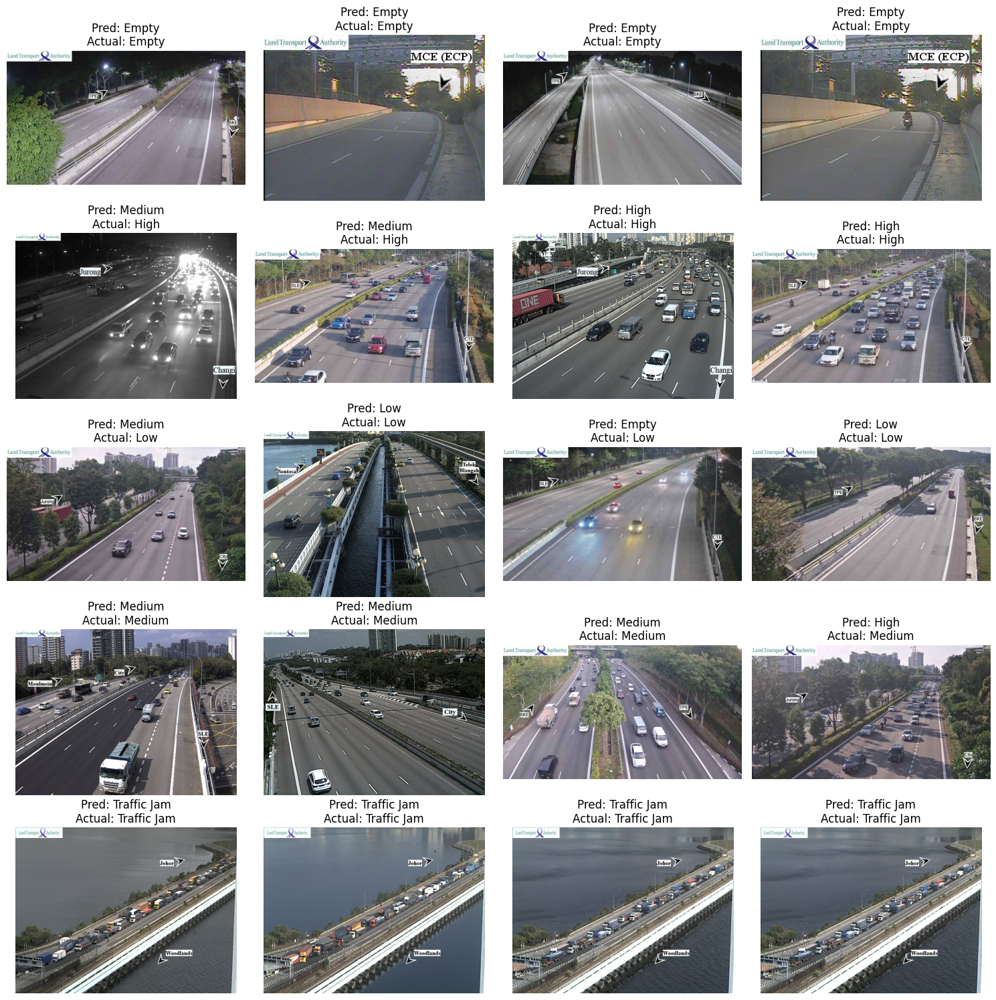

In [ ]:
# Predict using the MobileNetV2 model
mobilenetv2_predictions = mobilenetv2_model.predict(test_generator)

# Get predicted classes
mobilenetv2_predicted_classes = np.argmax(mobilenetv2_predictions, axis=1)

# Collect 4 images per class
images_per_class = 4
class_samples = {class_name: [] for class_name in test_generator.class_indices.keys()}
for filepath, predicted_label in zip(test_generator.filenames, mobilenetv2_predicted_classes):
    actual_class = filepath.split('/')[0]  # Extract actual class from the directory structure
    if len(class_samples[actual_class]) < images_per_class:
        class_samples[actual_class].append((filepath, predicted_label))

# Plot 4 images per class
num_classes = len(class_samples)
fig, axes = plt.subplots(num_classes, images_per_class, figsize=(15, num_classes * 3))
axes = axes if num_classes > 1 else [axes]  # Handle case with only one class

class_labels_inv = {v: k for k, v in test_generator.class_indices.items()}  # Reverse class mapping

for row_idx, (actual_class, samples) in enumerate(class_samples.items()):
    for col_idx in range(images_per_class):
        ax = axes[row_idx][col_idx] if num_classes > 1 else axes[col_idx]
        if col_idx < len(samples):
            filepath, predicted_label = samples[col_idx]
            img_path = os.path.join('/kaggle/input/traffic-density-singapore/Final Dataset/testing', filepath)
            img = plt.imread(img_path)
            ax.imshow(img)
            ax.axis('off')
            predicted_class = class_labels_inv[predicted_label]
            ax.set_title(f"Pred: {predicted_class}\nActual: {actual_class}")
        else:
            ax.axis('off')  # Hide unused subplots

plt.tight_layout()
plt.show()
